In [1]:
from scirpy.ir_dist import *
import pandas as pd
import seaborn as sns
# import colorcet as cc
# from scipy.cluster.hierarchy import dendrogram, linkage
import igraph as ig
from igraph import Graph

## Use filtered sequences for clustering
Filtering:
* In each sample use each unique sequence once (remove duplicates)
* Use only sequences that appear in more than 5 samples
* Optional: use only sequences that are not from a "1st" sampling (not used here at the moment)

### MIXCR

In [2]:
PLOTS_DIR = "mixcr_plots/"    # path to dir where to save the plots
TABLE_DIR = "mixcr_tabs/"     # path to dir where to save csv files

In [3]:
alpha_seqs = pd.read_csv("../../data/filtered_bcrtcr_seqs/mixcr_alpha_seqs.csv", index_col = 0)
alpha_ek_seqs = pd.read_csv("../../data/filtered_bcrtcr_seqs/mixcr_alpha_ek_seqs.csv", index_col = 0)
gamma_seqs = pd.read_csv("../../data/filtered_bcrtcr_seqs/mixcr_gamma_seqs.csv", index_col = 0)
omicron_seqs = pd.read_csv("../../data/filtered_bcrtcr_seqs/mixcr_omicron_seqs.csv", index_col = 0)
sero_seqs = pd.read_csv("../../data/filtered_bcrtcr_seqs/mixcr_sero_seqs.csv", index_col = 0)

In [4]:
alpha_seqs

,aaSeqCDR3,N
1,CQQSYSTPRTF,67
2,CQQYGSSPLTF,67
3,CQQYNNWPRTF,66
4,CQQYGSSPRTF,66
5,CQQRSNWPLTF,66
...,...,...
5719,CATWDRPNYYKKLF,5
5720,CASSLGGDGYTF,5
5721,CMQGIHLPPTF,5
5722,CQQYGTSPLF,5


In [5]:
# adc = metrics.AlignmentDistanceCalculator(cutoff = 15, n_jobs = 10)
# alpha_dist_mat = adc.calc_dist_mat(seqs = alpha_seqs["aaSeqCDR3"])
#alpha_ek_dist_mat = adc.calc_dist_mat(seqs = alpha_ek_seqs["aaSeqCDR3"])
#gamma_dist_mat = adc.calc_dist_mat(seqs = gamma_seqs["aaSeqCDR3"])
#omicron_dist_mat = adc.calc_dist_mat(seqs = omicron_seqs["aaSeqCDR3"])
#sero_dist_mat = adc.calc_dist_mat(seqs = sero_seqs["aaSeqCDR3"])

In [6]:
# sero_dist_mat

In [7]:
# Z = linkage(alpha_dist_mat.toarray(), "ward")
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z)

In [8]:
# Z_alpha_ek = linkage(alpha_ek_dist_mat.toarray(), "ward")
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z_alpha_ek)

In [9]:
# Z_gamma = linkage(gamma_dist_mat.toarray(), "ward")
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z_gamma)

In [10]:
# Z_omicron = linkage(omicron_dist_mat.toarray(), "ward")
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z_omicron)

In [11]:
# Z_sero = linkage(sero_dist_mat.toarray(), "ward")
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z_sero)

## TODO:
* Make distance according to BLOSUM (like TCRdist), done with AlignmentDistanceCalculator from scirpy
* Visualize in 2D maybe, done visualized with igraph
* combine all results and compute distances and cluster -> visualize coloured by group, done visualized with igraph
* and annotate Clusters
* Include trust4 data

#### test with all sequences that appear in more than half of the samples from alpha
Create a graph where the clusters are colored

In [12]:
alpha_seqs[alpha_seqs.N > 32]

,aaSeqCDR3,N
1,CQQSYSTPRTF,67
2,CQQYGSSPLTF,67
3,CQQYNNWPRTF,66
4,CQQYGSSPRTF,66
5,CQQRSNWPLTF,66
...,...,...
332,CGTWDTSLSAGVF,33
333,CQAWDSSTAYVF,33
334,CQQYNSFPYTF,33
335,CMQGTHWPTF,33


In [13]:
# cutoffs for sequence alignment scoring (larger value -> larger connected components (clusters))
CUTOFFs = [5, 10, 15]

In [14]:
igraphs_alpha_half = {}
for CUTOFF in CUTOFFs:
    # compute the distance between all sequences
    adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
    alpha_dist_mat_half = adc.calc_dist_mat(seqs = alpha_seqs.loc[alpha_seqs.N > 32, "aaSeqCDR3"])

    # create the graph from the adjacency matrix
    igraph_alpha_half = Graph.Weighted_Adjacency(alpha_dist_mat_half, mode='undirected', attr='distances', loops=False)

    # compute the clusters
    alpha_clusters_half = Graph.components(igraph_alpha_half) # , mode = "weak")

    # create color list
    colors = {}
    n_colors = max(alpha_clusters_half.membership)+1
    for i in range(n_colors):
        colors[i] = sns.color_palette("viridis", n_colors = n_colors)[i]

        # Add ids labels and colors according to cluster to vertices
    igraph_alpha_half.vs["id"]= alpha_seqs[alpha_seqs.N > 32].index
    igraph_alpha_half.vs["label"]= list(alpha_seqs[alpha_seqs.N > 32].loc[:, "aaSeqCDR3"])
    # igraph_alpha_half.vs["color"] = [colors.get(n) for n in alpha_clusters_half.membership]
    igraph_alpha_half.vs["color"] = "lightblue"
    igraph_alpha_half.vs["label_size"] = 4
    
    # add created igraph to list
    igraphs_alpha_half[CUTOFF] = igraph_alpha_half

C:\Users\User\Anaconda\envs\bcrtcr_jupyter\lib\site-packages\scirpy\ir_dist\metrics.py:200: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  yield seqs1[row : row + block_size], None, (row, row)
C:\Users\User\Anaconda\envs\bcrtcr_jupyter\lib\site-packages\scirpy\ir_dist\metrics.py:202: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  yield seqs1[row : row + block_size], seqs2[


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

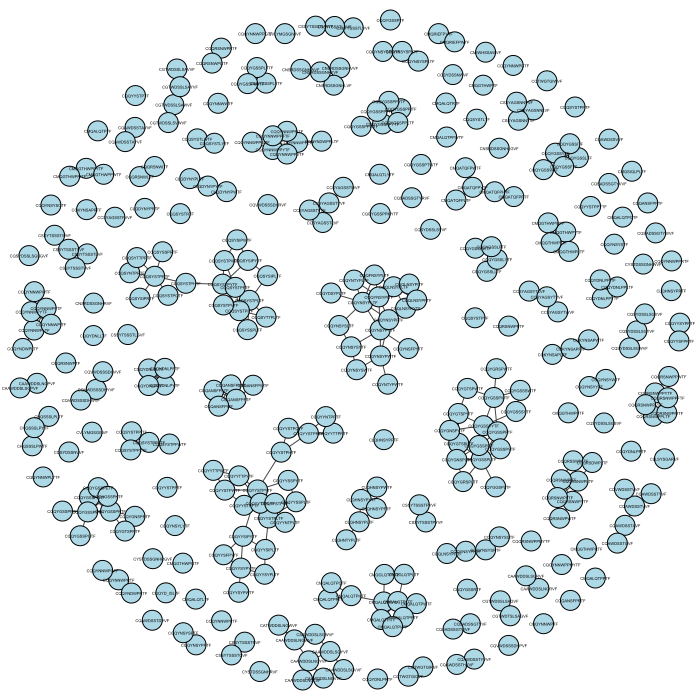

In [15]:
ig.plot(igraphs_alpha_half[5], bbox = (0, 0, 700, 700), target = f"{PLOTS_DIR}/alpha_half_5.svg")

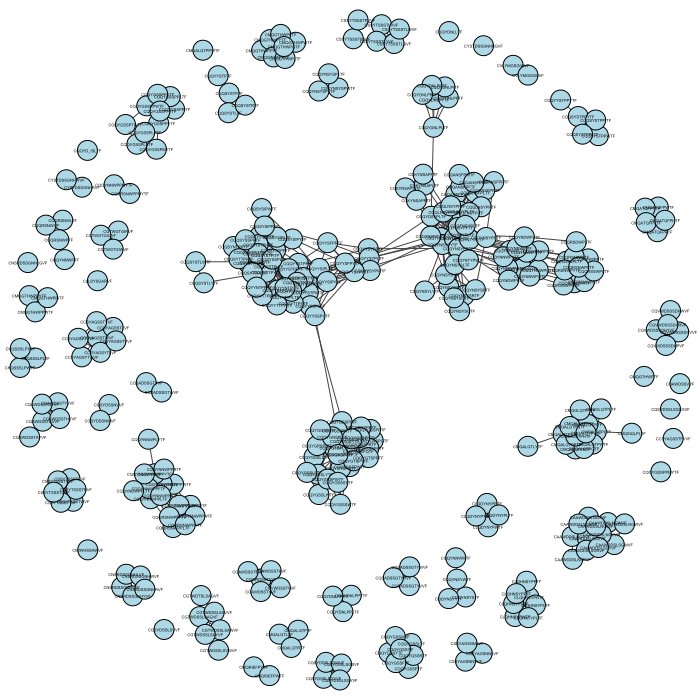

In [16]:
ig.plot(igraphs_alpha_half[10], bbox = (0, 0, 700, 700), target = f"{PLOTS_DIR}/alpha_half_10.svg")

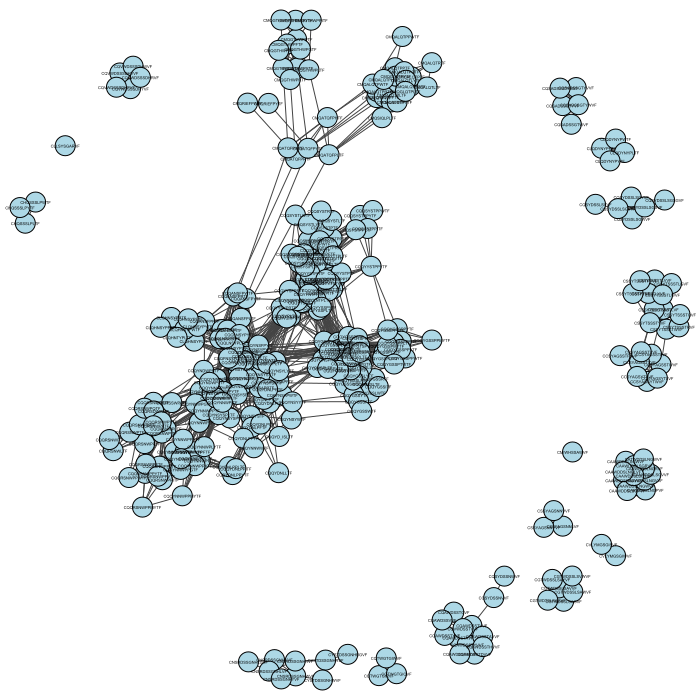

In [17]:
ig.plot(igraphs_alpha_half[15], bbox = (0, 0, 700, 700), target = f"{PLOTS_DIR}/alpha_half_15.svg")

#### Create a network with the all sequences that appear in more than half of the samples in each group from all variants and color by variant 
What about seqs that are present in more than one variant?

In [18]:
# add column with variant to each dataframe
alpha_seqs["Group"] = "Alpha"
alpha_ek_seqs["Group"] = "AlphaEK"
gamma_seqs["Group"] = "Gamma"
omicron_seqs["Group"] = "Omicron"
sero_seqs["Group"] = "Seronegative"

In [19]:
# create a dataframe with all sequences that appear in more than half ofthe samples in each group
all_seqs = pd.concat([alpha_seqs[alpha_seqs.N > 32],       # total 67
                      alpha_ek_seqs[alpha_ek_seqs.N > 14], # total 30
                      gamma_seqs[gamma_seqs.N > 2],        # total 3
                      omicron_seqs[omicron_seqs.N > 22],   # total 47
                      sero_seqs[sero_seqs.N > 25]])        # total 50
all_seqs

,aaSeqCDR3,N,Group
1,CQQSYSTPRTF,67,Alpha
2,CQQYGSSPLTF,67,Alpha
3,CQQYNNWPRTF,66,Alpha
4,CQQYGSSPRTF,66,Alpha
5,CQQRSNWPLTF,66,Alpha
...,...,...,...
352,CMQALQTPVTF,26,Seronegative
353,CQQSYTTPWTF,26,Seronegative
354,CSSYTSSSTLEVF,26,Seronegative
355,CALWEEELGKKIKVF,26,Seronegative


In [20]:
# group by sequence and merge group label
grouped_seqs_df = {}
for i in range(len(all_seqs)):
    aaSeq = all_seqs.iloc[i, 0]
    if aaSeq in grouped_seqs_df.keys():
        grouped_seqs_df[aaSeq] = grouped_seqs_df[aaSeq] + ", " + all_seqs.iloc[i, 2]
    else:
        grouped_seqs_df[aaSeq] = all_seqs.iloc[i, 2]

# print(grouped_seqs_df)
grouped_seqs_df = pd.DataFrame.from_dict(grouped_seqs_df, orient = "index", columns = ["Groups"])

In [21]:
grouped_seqs_df

,Groups
CQQSYSTPRTF,"Alpha, AlphaEK, Gamma, Omicron, Seronegative"
CQQYGSSPLTF,"Alpha, AlphaEK, Gamma, Omicron, Seronegative"
CQQYNNWPRTF,"Alpha, AlphaEK, Gamma, Omicron, Seronegative"
CQQYGSSPRTF,"Alpha, AlphaEK, Gamma, Omicron, Seronegative"
CQQRSNWPLTF,"Alpha, AlphaEK, Gamma, Omicron, Seronegative"
...,...
CQQANSFPHTF,Seronegative
CQQYNSYSITF,Seronegative
CMQGTHWPHTF,Seronegative
CAAWDYYKKLF,Seronegative


In [22]:
# cutoff for sequence alignment scoring
CUTOFFs = [5, 10, 15]

In [23]:
igraphs_all = {}
for CUTOFF in CUTOFFs:
    adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
    # compute the weighted adjacencies
    grouped_dist_mat = adc.calc_dist_mat(seqs = grouped_seqs_df.index)
    
    # create a graph from the adjacency matrix
    igraph_grouped = Graph.Weighted_Adjacency(grouped_dist_mat, mode='undirected', attr='distances', loops=False)
    
    # create color list
    colors = {"Alpha": "red", "AlphEK": "orange", "Gamma": "yellow", "Omicron": "green", "Seronegative": "blue", 
              "Alpha, AlphaEK, Gamma, Omicron, Seronegative":"lightblue2", "Alpha, AlphaEK, Gamma, Omicron":"grey3",
             "Alpha, AlphaEK" : "darkorange", "Alpha, Gamma": "pink", "Alpha, Omicron": "brown", "Alpha, Seronegative":"purple",
             "AlphaEK, pink2": "salmon", "AlphaEK, Omicron": "brown2", "AlphaEK, Seronegative":"purple2", 
              "Gamma, Omicron": "lime", "Gamma, Seronegative": "purple3"}
    
    # add ids, labels and color of the nodes
    igraph_grouped.vs["id"]= [i for i in range(len(grouped_seqs_df.index))]
    igraph_grouped.vs["label"]= grouped_seqs_df.index
    igraph_grouped.vs["label_size"] = 4
    # igraph_grouped.vs["color"] = [colors.get(group) if colors.get(group) else "lightblue" if "Seronegative" in group else "lightgrey" for group in grouped_seqs_df["Groups"]]
    igraph_grouped.vs["color"] = ["lightgrey" if "Seronegative" in group else "lightblue" for group in grouped_seqs_df["Groups"]]
    
    # add igraph to list
    igraphs_all[CUTOFF] = igraph_grouped

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

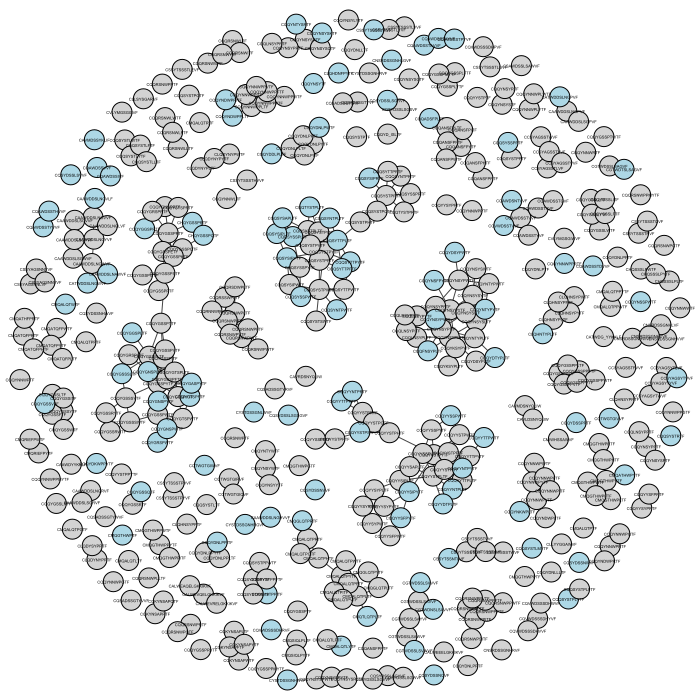

In [24]:
ig.plot(igraphs_all[5], bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/all_5.svg")

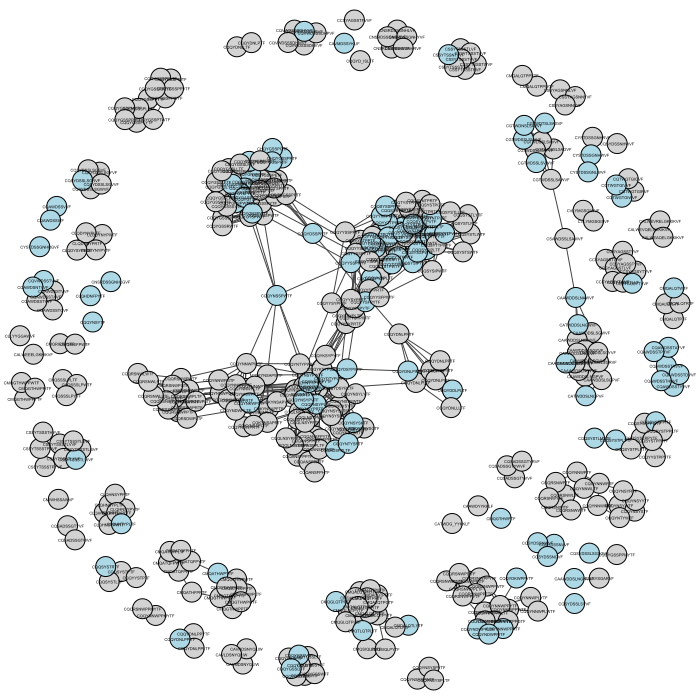

In [25]:
ig.plot(igraphs_all[10], bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/all_10.svg")

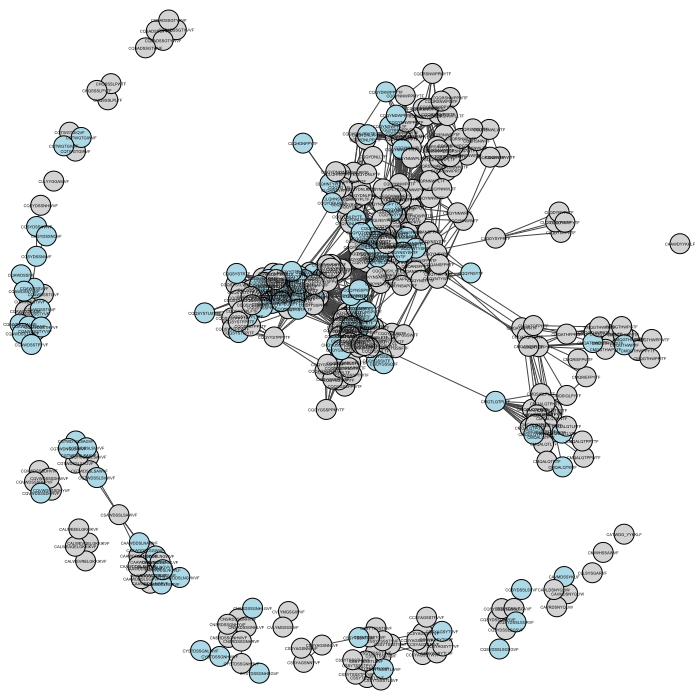

In [26]:
ig.plot(igraphs_all[15], bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/all_15.svg")

In [27]:
variant_only_seqs = {}
for CUTOFF in CUTOFFs:
    # compute the clusters
    grouped_clusters = Graph.components(igraphs_all[CUTOFF])  # , mode = "weak")
    grouped_seqs_df["clusters"] = grouped_clusters.membership
    
    # compute the weak clusters
    # grouped_clusters_weak = Graph.components(igraph_grouped, mode = "weak")
    # grouped_seqs_df["clusters_weak"] = grouped_clusters_weak.membership
    
    # get the connected components in the graph that conatin a node from seronegative group
    clusters_with_seron = set(grouped_seqs_df[grouped_seqs_df["Groups"].str.contains("Seronegative")].loc[:, "clusters"])
    
    # save sequences that are not connected to seronagative sequences to dict and to csv file
    variant_only_seqs[CUTOFF] = grouped_seqs_df[~grouped_seqs_df["clusters"].isin(clusters_with_seron)]
    grouped_seqs_df[~grouped_seqs_df["clusters"].isin(clusters_with_seron)].to_csv(f"{TABLE_DIR}/seqs_variants_only_{CUTOFF}.csv")

In [28]:
variant_only_seqs[5]

,Groups,clusters
CQAWDSSTYVVF,"Alpha, AlphaEK, Omicron",71
CYSTDSSGNHWVF,"Alpha, AlphaEK, Gamma",77
CYSTDSSGNHRGVF,"Alpha, AlphaEK, Gamma",91
CQSYDSSNVVF,Alpha,96
CNSRDSSGNHLGVF,Alpha,101
CQTWGTGIWVF,Alpha,102
CQAWDSSTAVVF,"Alpha, Omicron",103
CQAWDSSTDVVF,"Alpha, Gamma",106
CQQYNNWPPRTF,Alpha,108
CQQSYSTRTF,Alpha,111


In [29]:
variant_only_seqs[10]

,Groups,clusters
CQAWDSSTYVVF,"Alpha, AlphaEK, Omicron",27
CYSTDSSGNHRGVF,"Alpha, AlphaEK, Gamma",34
CQSYDSSNVVF,Alpha,36
CNSRDSSGNHLGVF,Alpha,39
CQAWDSSTAVVF,"Alpha, Omicron",27
CQAWDSSTDVVF,"Alpha, Gamma",27
CQSYDSSNWVF,Alpha,36
CQSYDSSLSGSGVF,Alpha,43
CQSYDSSLSVVF,"Alpha, Omicron",44
CQAWDSSTHVVF,Alpha,27


In [30]:
variant_only_seqs[15]

,Groups,clusters


 --> no sequences that do not cluster with a sequence appearing in seronegative with cutoff 15\
 --> found sequences that are unique to variants with cutoff 5 and 10

#### Remove the seronegatives

In [31]:
# create a distance matrix for alls seqs that are not in seronegative
grouped_seqs_nonseron = grouped_seqs_df[~grouped_seqs_df['Groups'].str.contains("Seronegative")]

In [32]:
# combine groups for more reasonable coloring
new_groups = []
for entry in grouped_seqs_nonseron.loc[:, "Groups"]:
    groups = entry.split(",")
    if len(groups) == 1:
        new_groups.append(groups[0])
    elif len(groups) == 4:
        new_groups.append("all")
    # all other combinations
    else:
        groups = [x.strip() for x in groups]
        new_groups.append("_".join(groups))
        
grouped_seqs_nonseron["Groups_combined"] = new_groups

C:\Users\User\AppData\Local\Temp\ipykernel_11396\2655957202.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_seqs_nonseron["Groups_combined"] = new_groups


In [33]:
# cutoff for sequence alignment scoring
CUTOFFs = [5, 10, 15]

igraphs_all_nonseron = {}
for CUTOFF in CUTOFFs:
    adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
    grouped_nonseron_dist_mat = adc.calc_dist_mat(seqs = grouped_seqs_nonseron.index)
    
    # create a graph from the adjacency matrix
    igraph_grouped_nonseron = Graph.Weighted_Adjacency(grouped_nonseron_dist_mat, mode='undirected', attr='distances', loops=False)
    
    # create color list
    colors = {"Alpha": "red", "AlphEK": "orange", "Gamma": "yellow", "Omicron": "green", "all": "blue",
             "Alpha_AlphaEK" : "darkorange", "Alpha_Gamma": "pink", "Alpha_Omicron": "brown",
             "AlphaEK_Gamma": "salmon", "AlphaEK_Omicron": "purple", "Gamma_Omicron": "lime"}
    
    # add ids, labels and color of nodes to graph
    igraph_grouped_nonseron.vs["id"]= [i for i in range(len(grouped_seqs_nonseron.index))]
    igraph_grouped_nonseron.vs["label"]= grouped_seqs_nonseron.index
    igraph_grouped_nonseron.vs["label_size"] = 4
    igraph_grouped_nonseron.vs["color"] = [colors.get(group) for group in grouped_seqs_nonseron["Groups_combined"]]
    
    # save igraph to dict
    igraphs_all_nonseron[CUTOFF] = igraph_grouped_nonseron

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [34]:
# grouped_seqs_nonseron

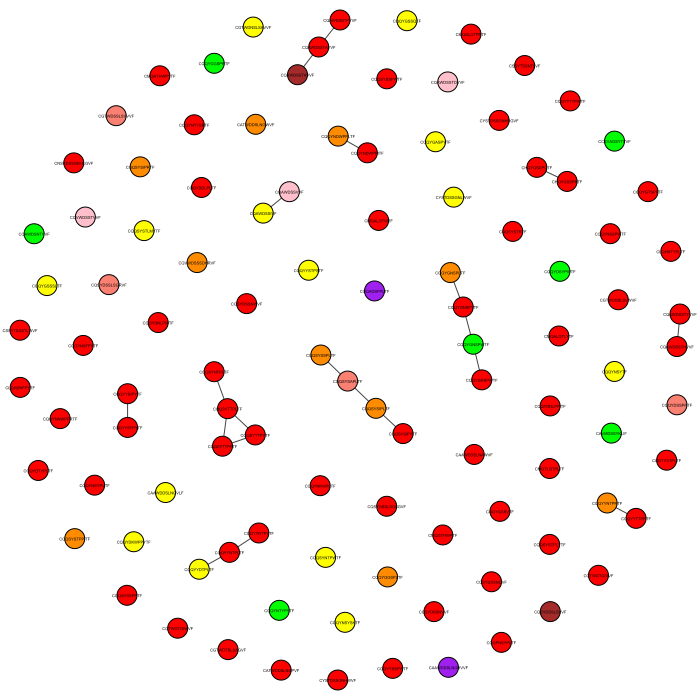

In [35]:
ig.plot(igraphs_all_nonseron[5], bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/all_wo_seron_5.svg")

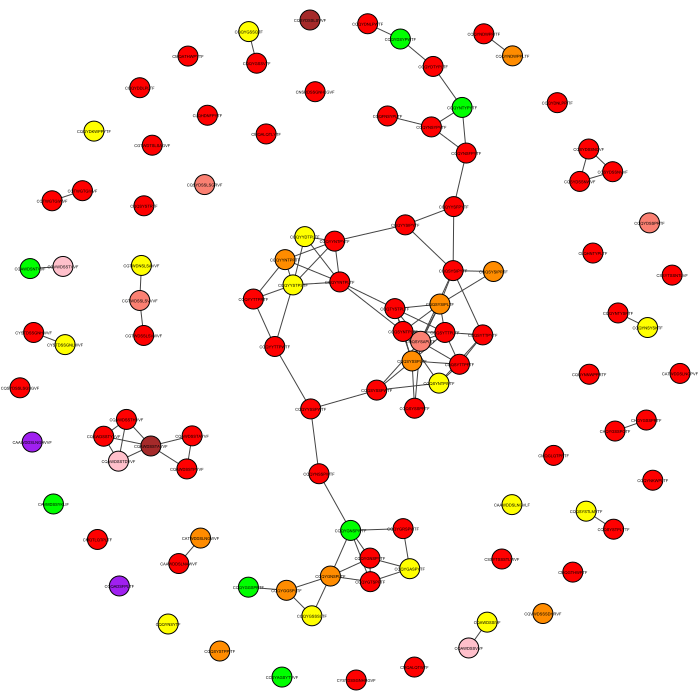

In [36]:
ig.plot(igraphs_all_nonseron[10], bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/all_wo_seron_10.svg")

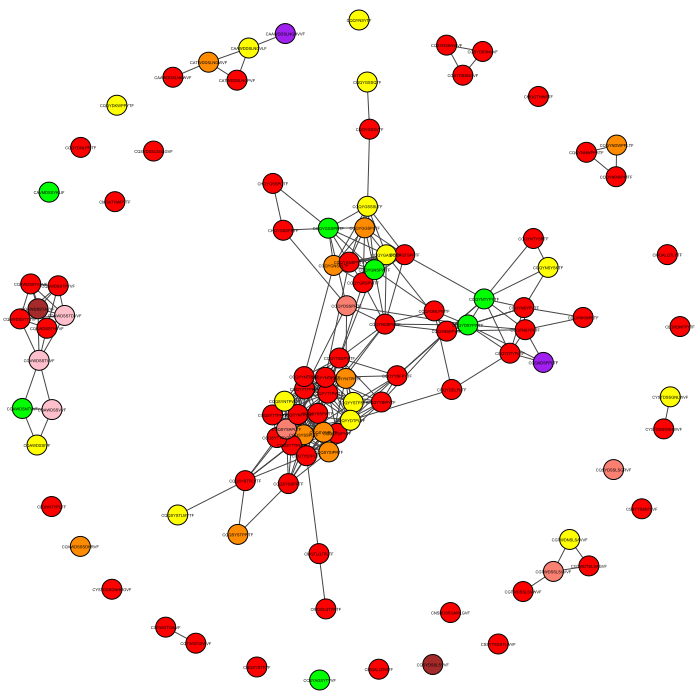

In [37]:
ig.plot(igraphs_all_nonseron[15], bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/all_wo_seron_15.svg")

## Agreement between MIXCR and TRUST4

In [167]:
TRUST_PLOTS_DIR = "trust4_plots/"
PLOTS_DIR = "plots/"

In [168]:
# read the filtered TRUST4 result sequences
alpha_seqs_trust = pd.read_csv("../../data/filtered_bcrtcr_seqs/trust_alpha_seqs.csv", index_col = 0)
alpha_ek_seqs_trust = pd.read_csv("../../data/filtered_bcrtcr_seqs/trust_alpha_ek_seqs.csv", index_col = 0)
gamma_seqs_trust = pd.read_csv("../../data/filtered_bcrtcr_seqs/trust_gamma_seqs.csv", index_col = 0)
omicron_seqs_trust = pd.read_csv("../../data/filtered_bcrtcr_seqs/trust_omicron_seqs.csv", index_col = 0)
sero_seqs_trust = pd.read_csv("../../data/filtered_bcrtcr_seqs/trust_sero_seqs.csv", index_col = 0)

In [169]:
alpha_seqs_trust = alpha_seqs_trust.rename(columns={"CDR3aa": "aaSeqCDR3"}) # rename sequence column to match mixcr
alpha_ek_seqs_trust = alpha_ek_seqs_trust.rename(columns={"CDR3aa": "aaSeqCDR3"}) # rename sequence column to match mixcr
gamma_seqs_trust = gamma_seqs_trust.rename(columns={"CDR3aa": "aaSeqCDR3"}) # rename sequence column to match mixcr
omicron_seqs_trust = omicron_seqs_trust.rename(columns={"CDR3aa": "aaSeqCDR3"}) # rename sequence column to match mixcr
sero_seqs_trust = sero_seqs_trust.rename(columns={"CDR3aa": "aaSeqCDR3"}) # rename sequence column to match mixcr

In [170]:
# add column with variant to each dataframe
alpha_seqs_trust["Group"] = "Alpha"
alpha_ek_seqs_trust["Group"] = "AlphaEK"
gamma_seqs_trust["Group"] = "Gamma"
omicron_seqs_trust["Group"] = "Omicron"
sero_seqs_trust["Group"] = "Seronegative"

In [171]:
alpha_seqs_trust

,aaSeqCDR3,N,Group
1,out_of_frame,67,Alpha
2,CQQSYSTPRTF,67,Alpha
3,CQQYGSSPLTF,67,Alpha
4,CQQRSNWPLTF,66,Alpha
5,CQQYNNWPRTF,66,Alpha
...,...,...,...
5954,CAASIGNFGNEKLTF,5,Alpha
5955,CATWDRPNYYKKLF,5,Alpha
5956,CASSLGGDGYTF,5,Alpha
5957,CMQGIHLPPTF,5,Alpha


In [172]:
# remove the "out_of_frame" sequences
alpha_seqs_trust = alpha_seqs_trust[alpha_seqs_trust.aaSeqCDR3 != "out_of_frame"]
alpha_ek_seqs = alpha_ek_seqs_trust[alpha_ek_seqs_trust.aaSeqCDR3 != "out_of_frame"]
gamma_seqs_trust = gamma_seqs_trust[gamma_seqs_trust.aaSeqCDR3 != "out_of_frame"]
omicron_seqs_trust = omicron_seqs_trust[omicron_seqs_trust.aaSeqCDR3 != "out_of_frame"]
sero_seqs_trust = sero_seqs_trust[sero_seqs_trust.aaSeqCDR3 != "out_of_frame"]

In [173]:
# add source "TRUST4" for merging with mixcr results
alpha_seqs_trust["source"] = "TRUST4"
alpha_ek_seqs_trust["source"] = "TRUST4"
gamma_seqs_trust["source"] = "TRUST4"
omicron_seqs_trust["source"] = "TRUST4"
sero_seqs_trust["source"] = "TRUST4"

# add source "MIXCR" to mixcr results
alpha_seqs["source"] = "MIXCR"
alpha_ek_seqs["source"] = "MIXCR"
gamma_seqs["source"] = "MIXCR"
omicron_seqs["source"] = "MIXCR"
sero_seqs["source"] = "MIXCR"
all_seqs["source"] = "MIXCR"

C:\Users\User\AppData\Local\Temp\ipykernel_11396\1090519905.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alpha_seqs_trust["source"] = "TRUST4"
C:\Users\User\AppData\Local\Temp\ipykernel_11396\1090519905.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alpha_ek_seqs["source"] = "MIXCR"


In [174]:
alpha_seqs_trust[alpha_seqs_trust.N > 32]

,aaSeqCDR3,N,Group,source
2,CQQSYSTPRTF,67,Alpha,TRUST4
3,CQQYGSSPLTF,67,Alpha,TRUST4
4,CQQRSNWPLTF,66,Alpha,TRUST4
5,CQQYNNWPRTF,66,Alpha,TRUST4
6,CQQYGSSPWTF,65,Alpha,TRUST4
...,...,...,...,...
357,CQQYDNWPRTF,33,Alpha,TRUST4
358,CQQSYSSPYTF,33,Alpha,TRUST4
359,CMQTLQTPLTF,33,Alpha,TRUST4
360,CQQYYSSPPTF,33,Alpha,TRUST4


In [175]:
alpha_seqs["source"] = "MIXCR"

In [176]:
alpha_mixcr_trust = pd.concat([alpha_seqs, alpha_seqs_trust])

In [177]:
unique_seqs = {}
for seq, source in zip(alpha_mixcr_trust.loc[:, "aaSeqCDR3"], alpha_mixcr_trust.loc[:, "source"]):
    if seq in unique_seqs.keys():
        unique_seqs[seq] = "MIXCR_TRUST4"
    else:
        unique_seqs[seq] = source
        
alpha_m_t_seqs = pd.DataFrame.from_dict(unique_seqs, orient = "index", columns = ["Source"])

In [178]:
alpha_m_t_seqs

,Source
CQQSYSTPRTF,MIXCR_TRUST4
CQQYGSSPLTF,MIXCR_TRUST4
CQQYNNWPRTF,MIXCR_TRUST4
CQQYGSSPRTF,MIXCR_TRUST4
CQQRSNWPLTF,MIXCR_TRUST4
...,...
CQQLHSYPITF,TRUST4
CQKYDTAPWTF,TRUST4
CMQAIQTPITF,TRUST4
CQQYNTYLWTF,TRUST4


In [72]:
CUTOFF = 10

adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
# alpha_m_t_dist_mat = adc.calc_dist_mat(seqs = alpha_m_t_seqs.index)

In [73]:
# create a graph from the adjacency matrix
# igraph_alpha_m_t = Graph.Weighted_Adjacency(alpha_m_t_dist_mat, mode='undirected', attr='distances', loops=False)

# create color list
# colors = {"MIXCR": "blue", "TRUST4": "green", "MIXCR_TRUST4": "aquamarine"}

# add ids, labels and color of nodes to graph
# igraph_alpha_m_t.vs["id"]= [i for i in range(len(alpha_m_t_seqs.index))]
# igraph_alpha_m_t.vs["label"]= alpha_m_t_seqs.index
# igraph_alpha_m_t.vs["label_size"] = 4
# igraph_alpha_m_t.vs["color"] = [colors.get(group) for group in alpha_m_t_seqs["Source"]]


In [49]:
# long computation, might crash
# ig.plot(igraph_alpha_m_t, bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/mixcr_trust_10.svg")

Numeric evaluation:

In [106]:
alpha_m_t_seqs.value_counts()

Source      
MIXCR_TRUST4    5047
TRUST4           910
MIXCR            676
dtype: int64

#### Only with sequences that appear in more than half of the samples

In [107]:
unique_seqs = {}
for seq, source in zip(alpha_mixcr_trust[alpha_mixcr_trust.N > 32].loc[:, "aaSeqCDR3"], alpha_mixcr_trust[alpha_mixcr_trust.N > 32].loc[:, "source"]):
    if seq in unique_seqs.keys():
        unique_seqs[seq] = "MIXCR_TRUST4"
    else:
        unique_seqs[seq] = source
        
alpha_m_t_seqs = pd.DataFrame.from_dict(unique_seqs, orient = "index", columns = ["Source"])

In [51]:
CUTOFF = 10

adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
alpha_m_t_dist_mat = adc.calc_dist_mat(seqs = alpha_m_t_seqs.index)

  0%|          | 0/36 [00:00<?, ?it/s]

In [52]:
# create a graph from the adjacency matrix
igraph_alpha_m_t = Graph.Weighted_Adjacency(alpha_m_t_dist_mat, mode='undirected', attr='distances', loops=False)

# create color list
colors = {"MIXCR": "blue", "TRUST4": "green", "MIXCR_TRUST4": "aquamarine"}

# add ids, labels and color of nodes to graph
igraph_alpha_m_t.vs["id"]= [i for i in range(len(alpha_m_t_seqs.index))]
igraph_alpha_m_t.vs["label"]= alpha_m_t_seqs.index
igraph_alpha_m_t.vs["label_size"] = 4
igraph_alpha_m_t.vs["color"] = [colors.get(group) for group in alpha_m_t_seqs["Source"]]

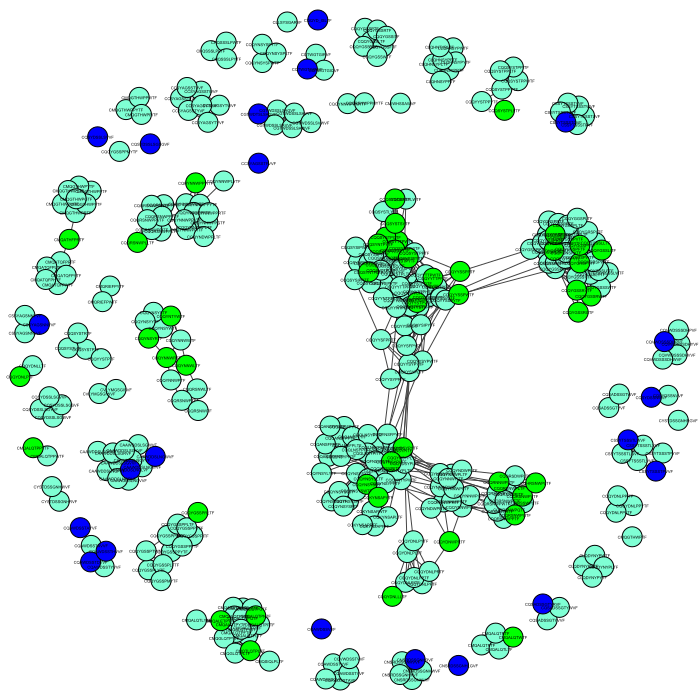

In [53]:
ig.plot(igraph_alpha_m_t, bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/alpha_mixcr_trust_half_10.svg")

Numeric evaluation:

In [103]:
alpha_m_t_seqs.value_counts()


Source      
MIXCR_TRUST4    315
TRUST4           45
MIXCR            21
dtype: int64

### Compare mixcr results for all groups with trust results for all groups

#### Combine trust results

In [179]:
# create a dataframe with all sequences that appear in more than half of the samples in each group
all_seqs_trust = pd.concat([alpha_seqs_trust[alpha_seqs_trust.N > 32],       # total 67
                      alpha_ek_seqs_trust[alpha_ek_seqs_trust.N > 14], # total 30
                      gamma_seqs_trust[gamma_seqs_trust.N > 2],        # total 3
                      omicron_seqs_trust[omicron_seqs_trust.N > 22],   # total 47
                      sero_seqs_trust[sero_seqs_trust.N > 25]])        # total 50
all_seqs_trust

,aaSeqCDR3,N,Group,source
2,CQQSYSTPRTF,67,Alpha,TRUST4
3,CQQYGSSPLTF,67,Alpha,TRUST4
4,CQQRSNWPLTF,66,Alpha,TRUST4
5,CQQYNNWPRTF,66,Alpha,TRUST4
6,CQQYGSSPWTF,65,Alpha,TRUST4
...,...,...,...,...
368,CQQSYTTPLTF,26,Seronegative,TRUST4
369,CQQYATSPLTF,26,Seronegative,TRUST4
370,CMQALQTLFTF,26,Seronegative,TRUST4
371,CQQSYSTPLFTF,26,Seronegative,TRUST4


In [180]:
# concatenate trust and mixcr results
all_m_t = pd.concat([all_seqs_trust, all_seqs])

In [181]:
# create a dataframe with sequences from mixcr and trust
unique_seqs = {}
for seq, source in zip(all_m_t.loc[:, "aaSeqCDR3"], all_m_t.loc[:, "source"]):
    if seq in unique_seqs.keys():
        unique_seqs[seq] = "MIXCR_TRUST4"
    else:
        unique_seqs[seq] = source
        
all_m_t_seqs = pd.DataFrame.from_dict(unique_seqs, orient = "index", columns = ["Source"])

In [182]:
CUTOFF = 10

adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
all_m_t_dist_mat = adc.calc_dist_mat(seqs = all_m_t_seqs.index)

  0%|          | 0/66 [00:00<?, ?it/s]

In [183]:
# create a graph from the adjacency matrix
igraph_all_m_t = Graph.Weighted_Adjacency(all_m_t_dist_mat, mode='undirected', attr='distances', loops=False)

# create color list
colors = {"MIXCR": "blue", "TRUST4": "green", "MIXCR_TRUST4": "aquamarine"}

# add ids, labels and color of nodes to graph
igraph_all_m_t.vs["id"]= [i for i in range(len(all_m_t_seqs.index))]
igraph_all_m_t.vs["label"]= all_m_t_seqs.index
igraph_all_m_t.vs["label_size"] = 4
igraph_all_m_t.vs["color"] = [colors.get(group) for group in all_m_t_seqs["Source"]]

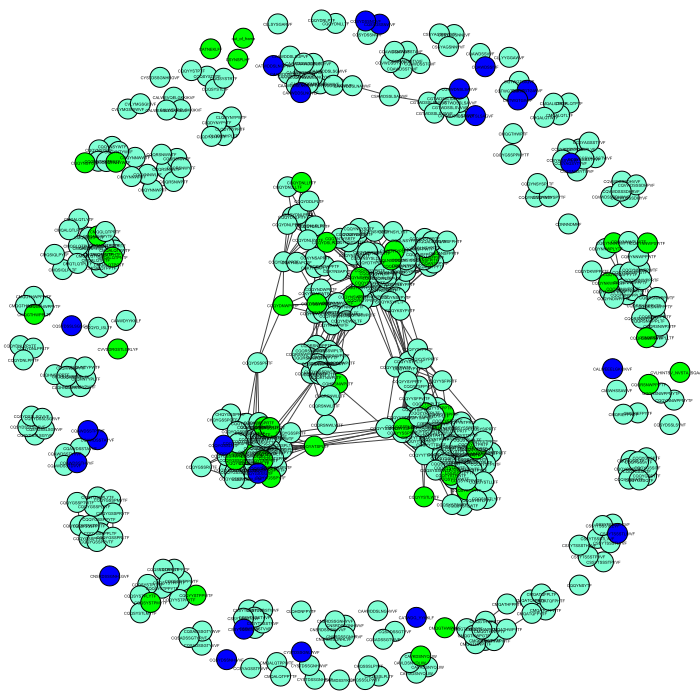

In [184]:
ig.plot(igraph_all_m_t, bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/mixcr_trust_all_10.svg")

Numeric evaluation:

In [185]:
all_m_t_seqs.value_counts()

Source      
MIXCR_TRUST4    447
TRUST4           45
MIXCR            23
dtype: int64

#### same without seronegative sequences

In [186]:
all_m_t[all_m_t.Group != "Seronegative"]

,aaSeqCDR3,N,Group,source
2,CQQSYSTPRTF,67,Alpha,TRUST4
3,CQQYGSSPLTF,67,Alpha,TRUST4
4,CQQRSNWPLTF,66,Alpha,TRUST4
5,CQQYNNWPRTF,66,Alpha,TRUST4
6,CQQYGSSPWTF,65,Alpha,TRUST4
...,...,...,...,...
285,CAAWDDSLNGHVVF,23,Omicron,MIXCR
286,CNSRDSSGNHYVF,23,Omicron,MIXCR
287,CMQGTHWPPWTF,23,Omicron,MIXCR
288,CLQDYNYPLTF,23,Omicron,MIXCR


In [187]:
all_m_t_nonseron = all_m_t[all_m_t.Group != "Seronegative"]

# create a dataframe with sequences from mixcr and trust
unique_seqs_nonseron = {}
for seq, source in zip(all_m_t_nonseron.loc[:, "aaSeqCDR3"], all_m_t_nonseron.loc[:, "source"]):
    if seq in unique_seqs_nonseron.keys():
        unique_seqs_nonseron[seq] = "MIXCR_TRUST4"
    else:
        unique_seqs_nonseron[seq] = source
        
all_m_t_seqs_nonseron = pd.DataFrame.from_dict(unique_seqs_nonseron, orient = "index", columns = ["Source"])

# compute the distance matrix
CUTOFF = 10

adc = metrics.AlignmentDistanceCalculator(cutoff = CUTOFF, n_jobs = 10)
all_m_t_dist_mat_nonseron = adc.calc_dist_mat(seqs = all_m_t_seqs_nonseron.index)

# create a graph from the adjacency matrix
igraph_all_m_t_nonseron = Graph.Weighted_Adjacency(all_m_t_dist_mat_nonseron, mode='undirected', attr='distances', loops=False)

# create color list
colors = {"MIXCR": "blue", "TRUST4": "green", "MIXCR_TRUST4": "aquamarine"}

# add ids, labels and color of nodes to graph
igraph_all_m_t_nonseron.vs["id"]= [i for i in range(len(all_m_t_seqs_nonseron.index))]
igraph_all_m_t_nonseron.vs["label"]= all_m_t_seqs_nonseron.index
igraph_all_m_t_nonseron.vs["label_size"] = 4
igraph_all_m_t_nonseron.vs["color"] = [colors.get(group) for group in all_m_t_seqs_nonseron["Source"]]

  0%|          | 0/55 [00:00<?, ?it/s]

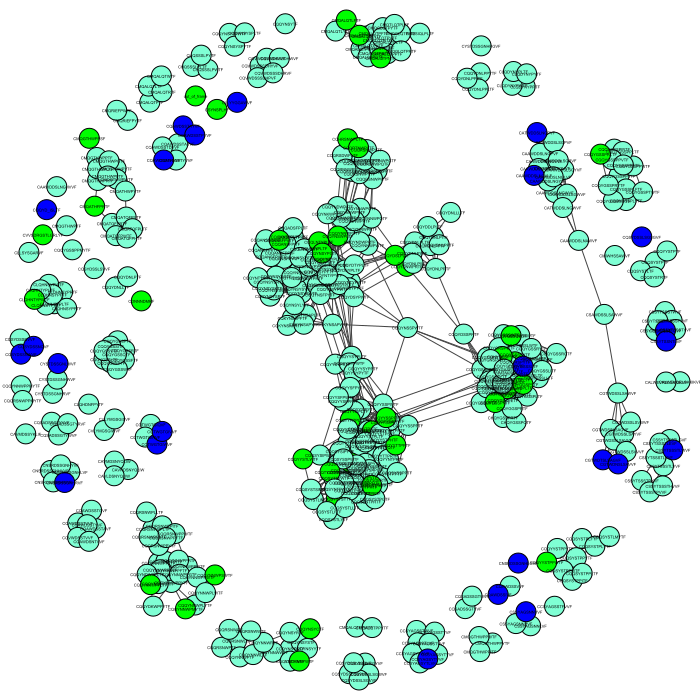

In [188]:
ig.plot(igraph_all_m_t_nonseron, bbox=(0, 0, 700, 700), target = f"{PLOTS_DIR}/mixcr_trust_all_nonseron_10.svg")

In [189]:
all_m_t_seqs_nonseron.value_counts()

Source      
MIXCR_TRUST4    415
TRUST4           40
MIXCR            24
dtype: int64

### Graph analysis
* Hub nodes
* Analysis of groups

In [131]:
from matplotlib import pyplot as plt

(array([43., 81., 48., 62., 31., 46., 20., 37., 24., 15., 26.,  8.,  9.,
         6., 12.,  8.,  7.,  6.,  4.,  9.,  2.,  4.,  3.,  2.,  2.]),
 array([ 0.  ,  1.56,  3.12,  4.68,  6.24,  7.8 ,  9.36, 10.92, 12.48,
        14.04, 15.6 , 17.16, 18.72, 20.28, 21.84, 23.4 , 24.96, 26.52,
        28.08, 29.64, 31.2 , 32.76, 34.32, 35.88, 37.44, 39.  ]),
 <BarContainer object of 25 artists>)

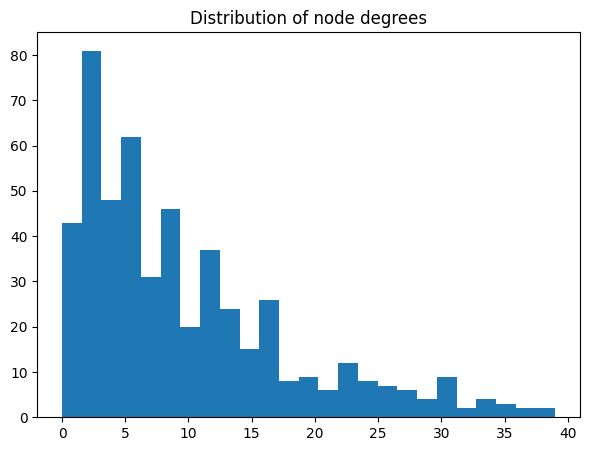

In [204]:
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot()
ax.set(title = "Distribution of node degrees")

ax.hist(igraph_all_m_t.indegree(), bins = 25)

In [157]:
vertex_df = igraph_all_m_t_nonseron.get_vertex_dataframe()
vertex_df["degree"] = igraph_all_m_t_nonseron.indegree()
vertex_df["component"] = Graph.components(igraph_all_m_t_nonseron).membership

In [161]:
vertex_df.sort_values("degree", ascending = False).head(10)

,id,label,label_size,color,degree,component
vertex ID,,,,,,
5,5,CQQSYSTPLTF,4,aquamarine,38,0
16,16,CQQSYSTPYTF,4,aquamarine,36,0
1,1,CQQYGSSPLTF,4,aquamarine,35,0
42,42,CQQYGSSPITF,4,aquamarine,33,0
135,135,CQQYGSSPVTF,4,aquamarine,33,0
13,13,CQQYYSTPLTF,4,aquamarine,33,0
11,11,CQQYGSSPYTF,4,aquamarine,33,0
14,14,CQQYGSSPFTF,4,aquamarine,33,0
59,59,CQQSYSTPFTF,4,aquamarine,32,0


In [162]:
vertex_df[vertex_df.component != 0].sort_values("degree", ascending = False).head(10)

,id,label,label_size,color,degree,component
vertex ID,,,,,,
21,21,CMQALQTPLTF,4,aquamarine,17,2
32,32,CMQALQTPFTF,4,aquamarine,16,2
10,10,CMQALQTPYTF,4,aquamarine,16,2
242,242,CMQALQTPVTF,4,aquamarine,15,2
51,51,CQQYNNWPPYTF,4,aquamarine,15,1
31,31,CMQALQTPITF,4,aquamarine,15,2
149,149,CMQALQTPQTF,4,aquamarine,14,2
23,23,CMQALQTPRTF,4,aquamarine,13,2
123,123,CMQALQTPHTF,4,aquamarine,13,2


Component 0 (CQQSYSTPLTF, CQQSYSTPYTF, CQQYGSSPLTF):
* immuneglobulin (kappa) light chain variable region
* anti-SARS-CoV-2 spike protein immunoglobulin light chain variable region
* anti-SARS-CoV-2 monoclonal antibody light chain variable region
* anti-rabies virus immunoglobulin light chain variable region
* anti-vaccinia virus immunoglobulin light chain variable region
* anti-HIV-1 immunoglobulin light chain variable region 

Component 1 (CQQYNNWPPYTF):
* immunoglobulin (kappa) light chain variable region
* immunoglobulin heavy chain variable region 
* IGH + IGL c494_light_IGKV3-15_IGKJ2
* anti-streptococcal/anti-lysoganglioside immunoglobulin light chain variable region

Component 2 (CMQALQTPLTF):
* immunoglobulin (kappa) (light chain) variable region
* anti-SARS-CoV-2 spike protein immunoglobulin light chain variable region
* anti-influenza immunoglobulin light chain

#### Analysis of Groups

Network with all groups except seronegative (MIXCR and TRUST)

In [190]:
all_m_t_nonseron["Group"].value_counts()

Alpha      696
AlphaEK    665
Omicron    613
Gamma      319
Name: Group, dtype: int64

In [196]:
all_m_t_nonseron["Group"].value_counts()

Alpha      696
AlphaEK    665
Omicron    613
Gamma      319
Name: Group, dtype: int64

([<matplotlib.patches.Wedge at 0x1261f472730>,
 [Text(0.6366481893892192, 0.8970390643374619, 'Alpha'),
  Text(-1.0429978111307034, 0.3495076050339413, 'Alpha+EK'),
  Text(-0.15695331582425853, -1.088744991562198, 'Omicron'),
  Text(0.9966020630394198, -0.46560103945929115, 'Gamma')])

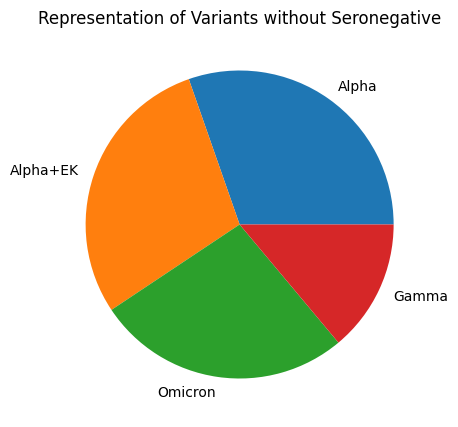

In [197]:
sizes = all_m_t_nonseron["Group"].value_counts()

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot()
ax.set(title = "Representation of Variants without Seronegative")

ax.pie(sizes, labels = ["Alpha", "Alpha+EK", "Omicron", "Gamma"])

For the network with seronegatives (MIXCR and TRUST):

In [191]:
all_m_t["Group"].value_counts()

Seronegative    727
Alpha           696
AlphaEK         665
Omicron         613
Gamma           319
Name: Group, dtype: int64

([<matplotlib.patches.Wedge at 0x126134ab490>,
 [Text(0.8001400750736125, 0.7548349887632354, 'Seronegative'),
  Text(-0.6794296553460693, 0.8650868993553894, 'Alpha'),
  Text(-0.9596057634081718, -0.53773299957676, 'Alpha+EK'),
  Text(0.2927981633152213, -1.060315630158885, 'Omicron'),
  Text(1.0399876350758992, -0.3583653427568556, 'Gamma')])

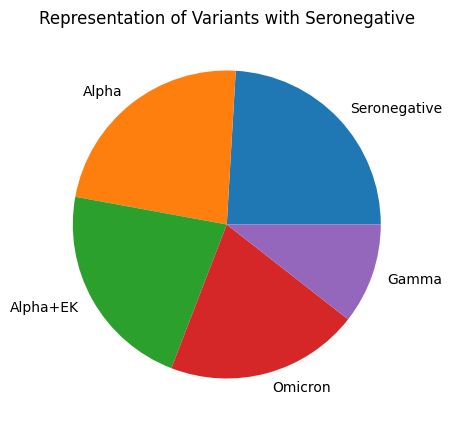

In [198]:
sizes = all_m_t["Group"].value_counts()

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot()
ax.set(title = "Representation of Variants with Seronegative")

ax.pie(sizes, labels = ["Seronegative", "Alpha", "Alpha+EK", "Omicron", "Gamma"])

With all possible labels

In [223]:
all_m_t

,aaSeqCDR3,N,Group,source
2,CQQSYSTPRTF,67,Alpha,TRUST4
3,CQQYGSSPLTF,67,Alpha,TRUST4
4,CQQRSNWPLTF,66,Alpha,TRUST4
5,CQQYNNWPRTF,66,Alpha,TRUST4
6,CQQYGSSPWTF,65,Alpha,TRUST4
...,...,...,...,...
352,CMQALQTPVTF,26,Seronegative,MIXCR
353,CQQSYTTPWTF,26,Seronegative,MIXCR
354,CSSYTSSSTLEVF,26,Seronegative,MIXCR
355,CALWEEELGKKIKVF,26,Seronegative,MIXCR


In [225]:
# group by sequence and merge group label
all_m_t_groups_df = {}
for i in range(len(all_m_t)):
    if all_m_t.iloc[i, 2] == "Gamma":
        continue
    aaSeq = all_m_t.iloc[i, 0]
    if aaSeq in all_m_t_groups_df.keys():
        all_m_t_groups_df[aaSeq] = all_m_t_groups_df[aaSeq].union({all_m_t.iloc[i, 2]})
    else:
        all_m_t_groups_df[aaSeq] = {all_m_t.iloc[i, 2]}

# print(grouped_seqs_df)
for key,item in all_m_t_groups_df.items():
    all_m_t_groups_df[key] = ",".join(item)
    
all_m_t_groups_df = pd.DataFrame.from_dict(all_m_t_groups_df, orient = "index", columns = ["Groups"])

In [226]:
all_m_t_groups_df

,Groups
CQQSYSTPRTF,"Omicron,Alpha,AlphaEK,Seronegative"
CQQYGSSPLTF,"Omicron,Alpha,AlphaEK,Seronegative"
CQQRSNWPLTF,"Omicron,Alpha,AlphaEK,Seronegative"
CQQYNNWPRTF,"Omicron,Alpha,AlphaEK,Seronegative"
CQQYGSSPWTF,"Omicron,Alpha,AlphaEK,Seronegative"
...,...
CCSYAGSYTVVF,Omicron
CATWDG_YYKKLF,Seronegative
CQQYGSSLRTF,Seronegative
CQSYDSSNHWVF,Seronegative


([<matplotlib.patches.Wedge at 0x1261f510c40>,
 [Text(-0.0765775970043236, 1.0973312497313852, 'Alpha,AlphaEK'),
  Text(-1.024082336491352, -0.4015661440988441, 'Omicron,AlphaEK'),
  Text(-0.7322388660969238, -0.8208691996762283, 'Omicron,Seronegative'),
  Text(-0.3425681965468638, -1.0452975799812365, 'Omicron,Alpha,AlphaEK,Seronegative'),
  Text(0.02090035751482488, -1.0998014252835613, 'Alpha'),
  Text(0.33594040272635034, -1.0474464405477055, 'Alpha,Omicron,AlphaEK'),
  Text(0.5877613237720356, -0.9298046172598544, 'AlphaEK'),
  Text(0.7728752331211924, -0.7827284803990864, 'Alpha,AlphaEK,Seronegative'),
  Text(0.8948071688397036, -0.6397813146639048, 'Omicron,AlphaEK,Seronegative'),
  Text(0.9782022149392969, -0.5031107499227717, 'Omicron'),
  Text(1.0290868693811592, -0.3885617264570523, 'Alpha,Omicron'),
  Text(1.0575583701117588, -0.30260583901597243, 'Alpha,Omicron,AlphaEK,Seronegative'),
  Text(1.0774829108007358, -0.22142849169059955, 'AlphaEK,Seronegative'),
  Text(1.090283

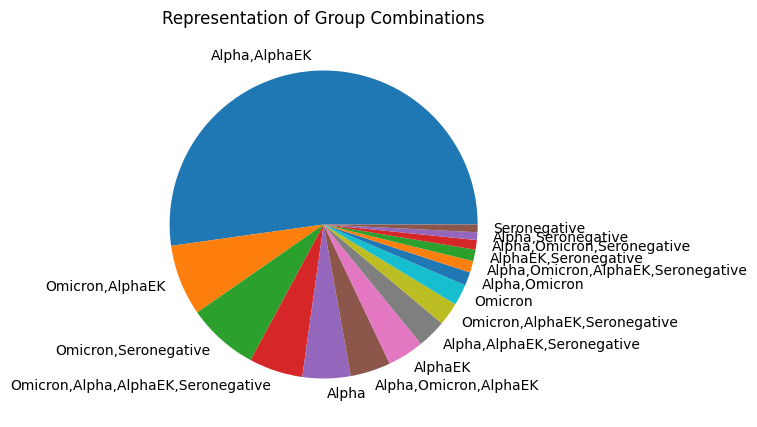

In [229]:
sizes = all_m_t_groups_df["Groups"].value_counts()
labels = set(all_m_t_groups_df["Groups"])

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot()
ax.set(title = "Representation of Group Combinations")

ax.pie(sizes, labels = labels)

A group "Alpha,AlphaEK" means that the sequences appear in Alpha and in AlphaEK samples.